# Principal Components Analysis

Principal Components Analysis (PCA) is a matrix-based technique for identifying the most interesting dimensions of a dataset. Mathematically, PCA finds the projection that maximizes the variance of the data. 

Remember the example we've seen of generating points from a normal distribution in $n$ dimensions?

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: covariance is not positive-semidefinite.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: covariance is not positive-semidefinite.
  if sys.path[0] == '':


Text(0.5,0.92,'3d data')

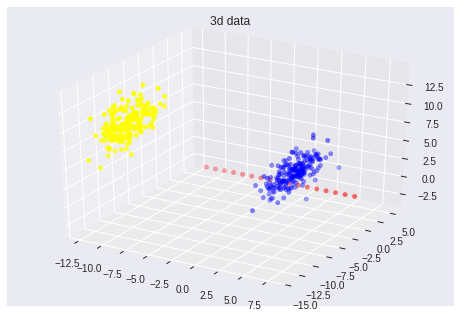

In [0]:
# LAMBDA SCHOOL
#
# MACHINE LEARNING
#
# MIT LICENSE

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd



x = np.linspace(-8,8,17)
Z = np.repeat(np.array([1,0,0]).reshape(1,3),17,axis=0).T * x

points1 = np.random.multivariate_normal([1,1,1],[[1,0.1,2],[0.1,1,1.5],[1,2,1]],200)
points2 = np.random.multivariate_normal([-10,-10,10],[[1,0.1,2],[0.1,1,1.5],[1,2,1]],200)

colors = np.concatenate([np.repeat('red',17),np.repeat('blue',200),np.repeat('yellow',200)])

from mpl_toolkits.mplot3d import Axes3D

all_points = np.concatenate([Z.T,points1,points2],axis=0)
xa, ya, za = all_points.T
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xa, ya, za, c=colors)
ax.set_title('3d data')

In $2d$ and $3d$ we can visualize these distributions and intuit them, but what do we do in $15d$, or greater? Frequently there are large numbers of dimensions in a high dimensional dataset that don't contribute much to the shape of the dataset. PCA gives us the ability to expose the covariance of each dimension, which vastly improves visualization techniques and can decrease the dimensionality of a dataset substantially.


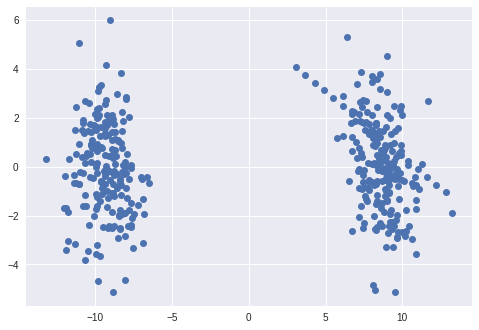

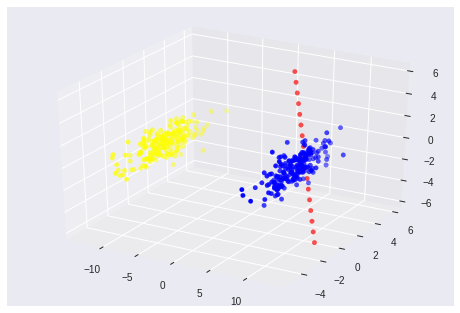

In [0]:
# Principal Components Analysis

import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
 
model = PCA(n_components=2)
model.fit(all_points)
X_2D = model.transform(all_points)
#print(model.components_)
#print(np.sqrt(model.singular_values_))
#print(model.get_covariance())
xx, xy = X_2D.T
plt.plot(xx,xy,'o')

model = PCA(n_components=3)
model.fit(all_points)
X_3D = model.transform(all_points)
#print(model.components_)
#print(np.sqrt(model.singular_values_))
#print(model.get_covariance())
xx, xy, xz = X_3D.T

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xx, xy, xz, c = colors);

In [0]:

# Principal Components Analysis

import pandas as pd
from sklearn.decomposition import PCA

model = PCA(n_components=2)
model.fit(all_points)
X_2D = model.transform(all_points)
print(model.components_)
print(np.sqrt(model.singular_values_))
print(model.get_covariance())


[[ 0.60987563  0.62110774 -0.49221631]
 [-0.32075227 -0.37449426 -0.86998393]]
[13.61515961  6.15515201]
[[ 31.80339558  31.01642987 -23.80478713]
 [ 31.01642987  33.00383704 -24.15700449]
 [-23.80478713 -24.15700449  22.62552005]]


# Assignment

Looking back at your carefully prepared and cleaned Titanic data, lets use PCA to look at the 2d and 3d projections of all of the features.

Use the example code above to create a PCA object with 2 components and plot the full 8D Titanic feature set using them. This projection maximizes the variance across all dimensions in your dataset. Without creating new features, this is the best "viewport" into the Titanic data that is available.

Do the same thing with a 3 component PCA and discuss the results.

Finally, experiment with the normalization techniques available in [scikit.preprocessing.normalize](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.normalize.html) on the original dataset before building your PCA. Does normalization appear to benefit?



In [0]:
import seaborn as sns

titanic = sns.load_dataset('titanic')
titanic = titanic.drop(['alive','adult_male','who','class','embark_town'], axis=1)
titanic['embarked'] = titanic['embarked'].fillna(method='ffill')
titanic = titanic.drop(['deck'], axis=1)
titanic['age'] = titanic['age'].fillna(method='ffill')

from sklearn.preprocessing import LabelEncoder

# Convert binomials and categoricals to encoded labels
for label in ['embarked','sex']:
    titanic[label] = LabelEncoder().fit_transform(titanic[label])

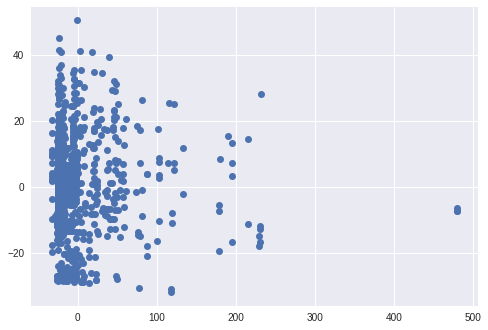

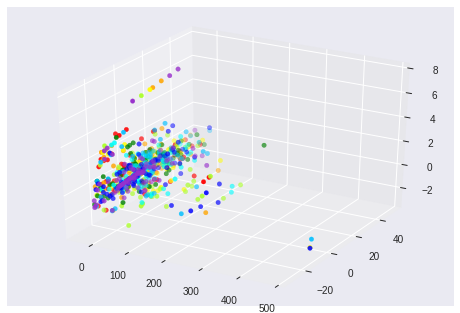

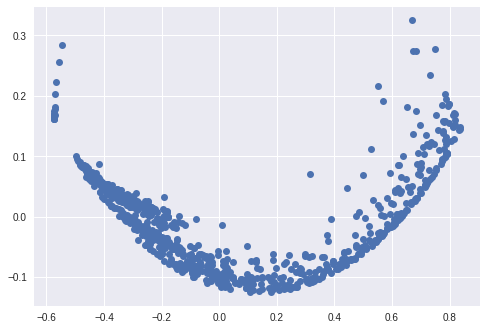

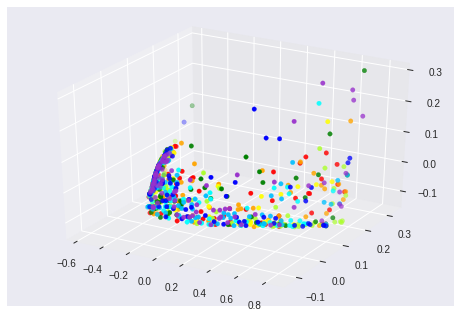

In [0]:
# Principal Components Analysis



model = PCA(n_components=2)
pts = titanic.as_matrix()
model.fit(pts)
X_2D = model.transform(pts)
xx, xy = X_2D.T
plt.plot(xx,xy,'o');

model = PCA(n_components=3)
model.fit(pts)
X_3D = model.transform(pts)
xx, xy, xz = X_3D.T

colors2 = np.concatenate([np.repeat('red',99),np.repeat('orange',99),np.repeat('yellow',99),
                        np.repeat('greenyellow',99), np.repeat('green',99), np.repeat('cyan',99),
                        np.repeat('deepskyblue',99), np.repeat('blue',99), np.repeat('darkorchid',99)])

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xx, xy, xz, c=colors2);
plt.show()
# --------------------------- Normalized ---------------------------

model = PCA(n_components=2)
pts2 = normalize(titanic)
model.fit(pts2)
X_2D = model.transform(pts2)
xx, xy = X_2D.T
plt.plot(xx,xy,'o');

model = PCA(n_components=3)
model.fit(pts2)
X_3D = model.transform(pts2)
xx, xy, xz = X_3D.T

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xx, xy, xz, c=colors2);

# Thinking about your assignment

1. What is PCA, mathematically?
2. What does PCA do to a data set?
3. What "shape" does data have?
4. What steps are in the above PCA example?
5. What steps must I duplicate to apply PCA to Titanic?
6. Where is my Titanic dataset, and how can I use it here effectively?
7. What is my final objective in this assignment?

1. PCA finds the principal components of the data which are directions along which data varies the most.
2. PCA reduces dimensionality  of the data by combining correlated features into one and replacing them with a function that best describes their correlation.
3. Data can be described as a matrix.
4. a) Data is tranformed into a matrix.

  b) Learning model parameters are generated from training data.
  
  c) Generated parameters are applied onto the model to generate transformed data set.
5. All the steps.
6. Titanic dataset has been uploaded and assigned to the 'titanic' variable.
7. The final objective is to understand how PCA works.


# Stretch Goal

## Eigenfaces

One of the most interesting ways to understand PCA involves image processing. As you know, every image is in fact a single high dimensional point where each pixel is a dimension of the point. When presented with a collection of $m$ images in $n$ dimensions, where $n$ is the number of pixels per image, PCA produces a very interesting set of components.

The first component, known as the first eigenvector, is the set of most frequent characteristics of a face from this dataset. Every face starts with this eigenface, then adds components of the other eigenfaces to produce each unique face.

In [0]:
!wget http://www.cl.cam.ac.uk/Research/DTG/attarchive/pub/data/att_faces.zip -O att_faces.zip
!unzip att_faces.zip

(112, 92)
['s12/2.pgm', 's12/5.pgm', 's12/7.pgm', 's12/6.pgm', 's12/10.pgm', 's12/9.pgm', 's12/8.pgm', 's12/1.pgm', 's12/3.pgm', 's12/4.pgm', 's19/2.pgm', 's19/5.pgm', 's19/7.pgm', 's19/6.pgm', 's19/10.pgm', 's19/9.pgm', 's19/8.pgm', 's19/1.pgm', 's19/3.pgm', 's19/4.pgm', 's6/2.pgm', 's6/5.pgm', 's6/7.pgm', 's6/6.pgm', 's6/10.pgm', 's6/9.pgm', 's6/8.pgm', 's6/1.pgm', 's6/3.pgm', 's6/4.pgm', 's26/2.pgm', 's26/5.pgm', 's26/7.pgm', 's26/6.pgm', 's26/10.pgm', 's26/9.pgm', 's26/8.pgm', 's26/1.pgm', 's26/3.pgm', 's26/4.pgm', 's35/2.pgm', 's35/5.pgm', 's35/7.pgm', 's35/6.pgm', 's35/10.pgm', 's35/9.pgm', 's35/8.pgm', 's35/1.pgm', 's35/3.pgm', 's35/4.pgm', 's34/2.pgm', 's34/5.pgm', 's34/7.pgm', 's34/6.pgm', 's34/10.pgm', 's34/9.pgm', 's34/8.pgm', 's34/1.pgm', 's34/3.pgm', 's34/4.pgm', 's17/2.pgm', 's17/5.pgm', 's17/7.pgm', 's17/6.pgm', 's17/10.pgm', 's17/9.pgm', 's17/8.pgm', 's17/1.pgm', 's17/3.pgm', 's17/4.pgm', 's32/2.pgm', 's32/5.pgm', 's32/7.pgm', 's32/6.pgm', 's32/10.pgm', 's32/9.pgm', 's3

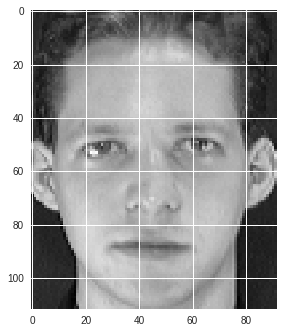

In [0]:
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from scipy.misc import imread
from itertools import chain
import numpy as np
import scipy as sp

img = imread('s1/1.pgm')
img = img.astype(np.uint8)
img = img / 255
plt.imshow(img,cmap='gray')
print(img.shape)

import glob

filenames = [img for img in glob.glob("s*/*.pgm")]
print(filenames)

m = [[] for i in range(400)]

for i in range(400):
  m[i] = list(chain.from_iterable(imread(filenames[i])))
  
m = np.matrix(m)
print(m.shape)

In [0]:
model = PCA(n_components=40)
pts = normalize(m)
model.fit(pts)
pts2 = model.transform(pts)

# U, S, V = sp.linalg.svd(m)

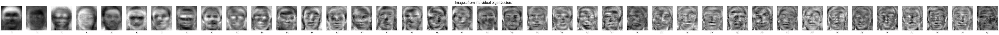

In [0]:
fig1, ax = plt.subplots(1,40, figsize = (100,5))
fig1.suptitle('Images from individual eigenvectors', fontsize = 20)
fig1.subplots_adjust(top=1.3)

for i in range(40):
  ord = model.components_[i]
  img = ord.reshape(112,92)
  ax[i].imshow(img,cmap='gray')
  ax[i].xaxis.set_visible(False)
  ax[i].yaxis.set_visible(False)
  ax[i].set_title(str(i+1), y=-0.15)

# fig2, ax = plt.subplots(1,10, figsize = (25,5))  
# fig2.suptitle('Images from compounded sum of eigenvectors', fontsize = 20)
# fig2.subplots_adjust(top=1.3)

# ords = []

# for i in range(10):
#   ords.append(model.components_[i])
#   img = sum(ords)
#   img = img.reshape(112,92)
#   ax[i].imshow(img,cmap='gray')
#   ax[i].xaxis.set_visible(False)
#   ax[i].yaxis.set_visible(False)
#   ax[i].set_title('0 - '+str(i+1), y=-0.15)

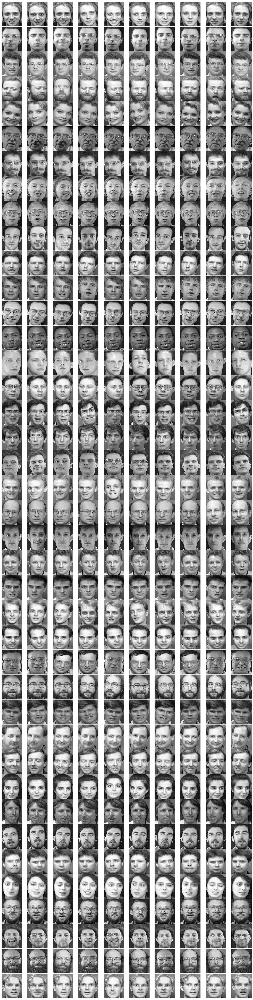

In [0]:
fig, axes = plt.subplots(40,10,figsize=(20,80),
            subplot_kw={'xticks':[], 'yticks':[]},
            gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
    ax.imshow(m[i].reshape(112,92),cmap="gray")


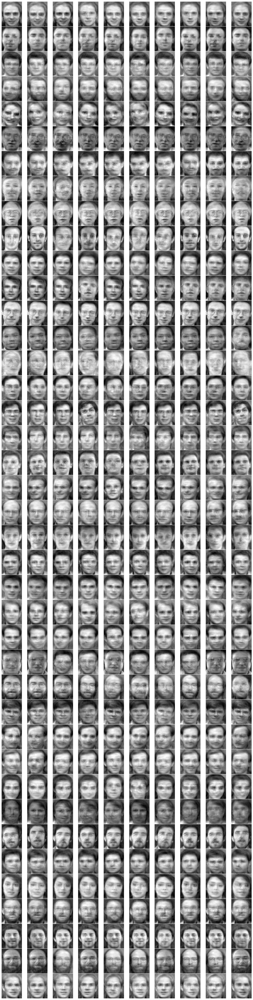

In [0]:
faces_pca = PCA(n_components=40)
faces_pca.fit(m)
    
components = faces_pca.transform(m)
projected = faces_pca.inverse_transform(components)

fig, axes = plt.subplots(40,10,figsize=(20,80),
            subplot_kw={'xticks':[], 'yticks':[]},
            gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
    ax.imshow(projected[i].reshape(112,92),cmap="gray")